In [1]:
import tensorflow as tf
import numpy as np
import keras
import pandas as pd
import matplotlib.pyplot as plt
from sklearn import preprocessing
import h5py

from unet_config import config
from data_preprocessing import generate_data
from utils import plot_heartecg, plot_loss, create_directory
from model import wave_u_net

storing and importing parameters from other file

In [2]:
model_config = config()

In [3]:
# Parameters for the Wave-U-net

params = {
  "num_initial_filters": model_config["num_initial_filters"],
  "num_layers": model_config["num_layers"],
  "kernel_size": model_config["kernel_size"],
  "merge_filter_size": model_config["merge_filter_size"],
  "source_names": model_config["source_names"],
  "num_channels": model_config["num_channels"], 
  "num_channels_output": model_config["num_channels_output"],
  "output_filter_size": model_config["output_filter_size"],
  "padding": model_config["padding"],
  "input_size": model_config["input_size"],
  "context": model_config["context"],
  "upsampling_type": model_config["upsampling_type"],         # "learned" or "linear"
  "output_activation": model_config["output_activation"],        # "linear" or "tanh"
  "output_type": model_config["output_type"],          # "direct" or "difference" 
  "dropout_rate": model_config["dropout_rate"],
}

In [4]:
m = wave_u_net(**params)

Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: module 'gast' has no attribute 'Index'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: module 'gast' has no attribute 'Index'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: module 'gast' has no attribute 'Index'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `

In [5]:
m.summary()

Model: "functional_1"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
raw_input (InputLayer)          [(None, 22050, 4)]   0                                            
__________________________________________________________________________________________________
Down_Conv_0 (Conv1D)            (None, 22036, 24)    1464        raw_input[0][0]                  
__________________________________________________________________________________________________
batch_normalization (BatchNorma (None, 22036, 24)    96          Down_Conv_0[0][0]                
__________________________________________________________________________________________________
dropout (Dropout)               (None, 22036, 24)    0           batch_normalization[0][0]        
_______________________________________________________________________________________

In [6]:
m.output

{'heart_ecg': <tf.Tensor 'independent_out/conv1d/BiasAdd:0' shape=(None, 21060, 8) dtype=float32>}

In [7]:
output_shape = (model_config["batch_size"], m.output[model_config["source_names"][0]].shape[1], model_config["num_channels"]*2)

input_shape = (model_config["batch_size"], model_config["input_size"], model_config["num_channels"])

print(input_shape)
print(output_shape)

(3, 22050, 4)
(3, 21060, 8)


Create directory to save output data in

In [8]:
create_directory(model_config["output_path"])

Load data and generate twin data 

In [9]:
x_train, y_train, x_test_long, y_test_long, hr_1_list, hr_2_list = generate_data(model_config, output_shape[1])

x_test_long contains: (number of samples to test, the amount of chunks that the samples are divided into, input shape, channels)

In [10]:
print(x_test_long.shape)

(10, 6, 22050, 4)


The hr_1 list and hr_2 list contain the patient numbers of the test data

In [11]:
print('test1: ', hr_1_list, 'test2: ', hr_2_list)

test1:  ['291', '357', '178', '265', '426', '168', '085', '408', '142', '094'] test2:  ['117', '310', '465', '378', '278', '418', '142', '427', '091', '323']


Training parameters and train the model

In [12]:
loss_fn = tf.keras.losses.MeanSquaredError(reduction="auto", name="mean_squared_error")
opt = keras.optimizers.Adam(learning_rate=model_config["init_sup_sep_lr"])
m.compile(optimizer=opt, loss=loss_fn, metrics=["mae"])

In [13]:
history = m.fit(x=x_train, y=y_train, validation_split=model_config["validation_split"], batch_size=model_config["batch_size"], epochs=model_config["epochs"])
# history = m.fit(x=x_train, y=y_trains_scaled, validation_split=model_config["validation_split"], batch_size=model_config["batch_size"], epochs=model_config["epochs"])

Epoch 1/10
8/8 [==============================] - 5s 590ms/step - loss: 1.0015 - mae: 0.7593 - val_loss: 0.0456 - val_mae: 0.1545
Epoch 2/10
8/8 [==============================] - 4s 541ms/step - loss: 0.9699 - mae: 0.7449 - val_loss: 0.0461 - val_mae: 0.1560
Epoch 3/10
8/8 [==============================] - 4s 542ms/step - loss: 0.9329 - mae: 0.7274 - val_loss: 0.0475 - val_mae: 0.1598
Epoch 4/10
8/8 [==============================] - 5s 567ms/step - loss: 0.9008 - mae: 0.7159 - val_loss: 0.0496 - val_mae: 0.1651
Epoch 5/10
8/8 [==============================] - 4s 562ms/step - loss: 0.8901 - mae: 0.7185 - val_loss: 0.0525 - val_mae: 0.1719
Epoch 6/10
8/8 [==============================] - 4s 561ms/step - loss: 0.8555 - mae: 0.7010 - val_loss: 0.0559 - val_mae: 0.1797
Epoch 7/10
8/8 [==============================] - 5s 566ms/step - loss: 0.8442 - mae: 0.6996 - val_loss: 0.0598 - val_mae: 0.1885
Epoch 8/10
8/8 [==============================] - 5s 564ms/step - loss: 0.8187 - mae: 0.68

In [14]:
# model.save_weights('gfgModelWeights')

m.save_weights(model_config["output_path"]+'/model'+'/saved_model_weights')

In [15]:
savedModel = m.load_weights(model_config["output_path"]+'/model'+'/saved_model_weights')

In [16]:
hist = pd.DataFrame(history.history)
hist['epoch'] = history.epoch
hist.tail()

,loss,mae,val_loss,val_mae,epoch
5,0.855513,0.700990,0.055872,0.179664,5
6,0.844186,0.699622,0.059800,0.188493,6
7,0.818703,0.687159,0.064251,0.198060,7
8,0.814025,0.688897,0.069451,0.208397,8
9,0.778599,0.672158,0.075588,0.219888,9


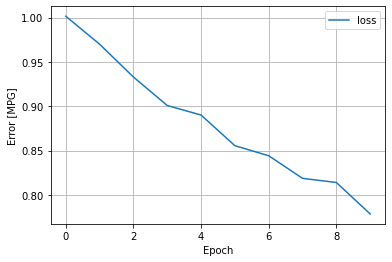

In [18]:
plot_loss(history.history)

In [19]:
np.save(model_config["output_path"]+'/history/history1.npy',history.history)

In [20]:
x_test_long.shape

(10, 6, 22050, 4)

Put all the predictions per sample in a list

In [21]:
predictions_list = []

for entries in range(len(x_test_long)):
    prediction = m.predict(np.array(x_test_long[entries]))
#     print(np.array(x_test_long[entries]).shape)
    predictions_list.append(prediction)

Save the test patient numbers 

In [22]:
np.save(model_config["output_path"]+'/test_predictions/hr_1_list.npy',hr_1_list)
np.save(model_config["output_path"]+'/test_predictions/hr_2_list.npy',hr_2_list)

Go over data of length 147443 in jumps of 21060

In [23]:
for i, predictions in enumerate(predictions_list):
    
    dim_1, dim_2, _ = predictions[model_config["source_names"][0]].shape
    
    y_test1_single_all = np.zeros((1, dim_1*dim_2, model_config["num_channels"]))
    y_test2_single_all = np.zeros((1, dim_1*dim_2, model_config["num_channels"]))
    y_pred_test1_single_all = np.zeros((1, dim_1*dim_2, model_config["num_channels"]))
    y_pred_test2_single_all = np.zeros((1, dim_1*dim_2, model_config["num_channels"]))
    x_test_single_all = np.zeros((1, dim_1*model_config["input_size"], model_config["num_channels"]))
    
    for sample in range(dim_1):
        # get number of heart ecgs
        hr_1 = hr_1_list[i]
        hr_2 = hr_2_list[i]
        
        # Get x and y values 
        y_test1_single = y_test_long[i, sample, :, model_config["num_channels"]:][None, ...]
        y_test2_single = y_test_long[i, sample, :, :model_config["num_channels"]][None, ...]
        x_test_single = x_test_long[i, sample, :, :][None, ...]
        
        predictions_test = m.predict(x_test_single)
        
        pred_test = predictions_test[model_config["source_names"][0]]
        
        y_test1_single_all[:,sample*dim_2:(sample+1)*dim_2,:] = y_test1_single
        y_test2_single_all[:,sample*dim_2:(sample+1)*dim_2,:] = y_test2_single
        y_pred_test1_single_all[:,sample*dim_2:(sample+1)*dim_2,:] = pred_test[:,:,model_config["num_channels"]:]
        y_pred_test2_single_all[:,sample*dim_2:(sample+1)*dim_2,:] = pred_test[:,:,:model_config["num_channels"]]
        x_test_single_all[:,sample*model_config["input_size"]:(sample+1)*model_config["input_size"],:] = x_test_single
    
    with h5py.File(model_config["output_path"]+f'/test_predictions/patient_{hr_1}{hr_2}.signal', 'w') as f:
      f.create_dataset('hr_1_original', data=y_test1_single_all)
      f.create_dataset('hr_2_original', data=y_test2_single_all)
      f.create_dataset('hr_1_extracted', data=y_pred_test1_single_all)
      f.create_dataset('hr_2_extracted', data=y_pred_test2_single_all)
      f.create_dataset('twin_hr', data=x_test_single_all)

Plot predicitions

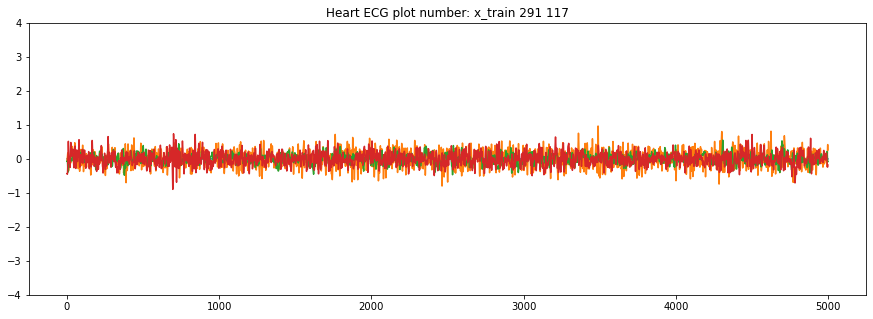

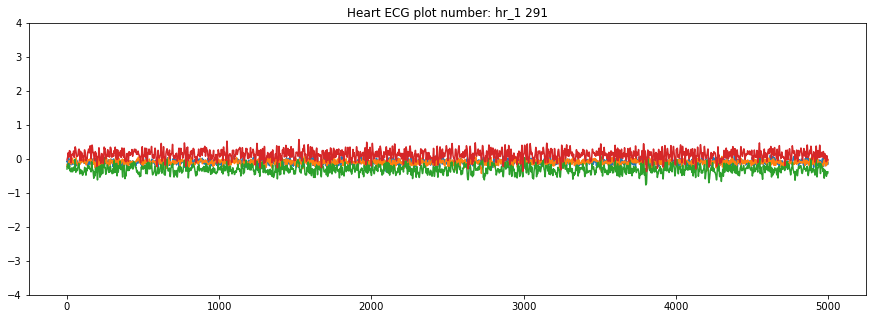

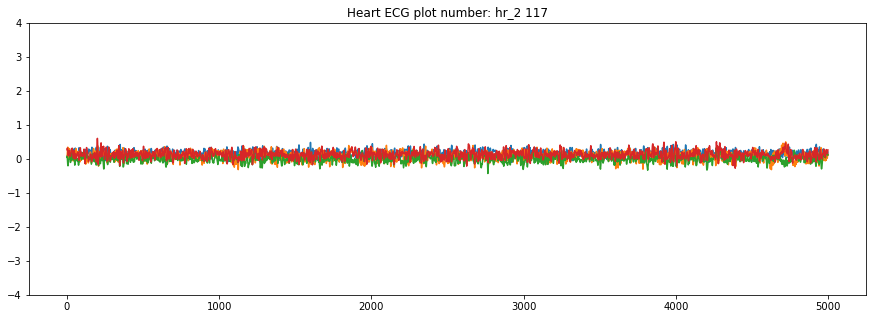

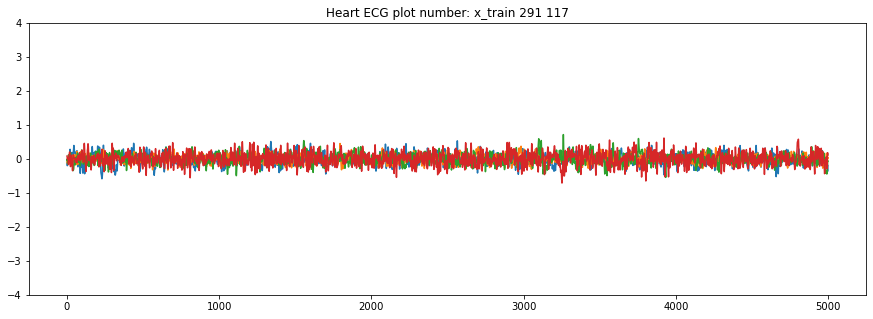

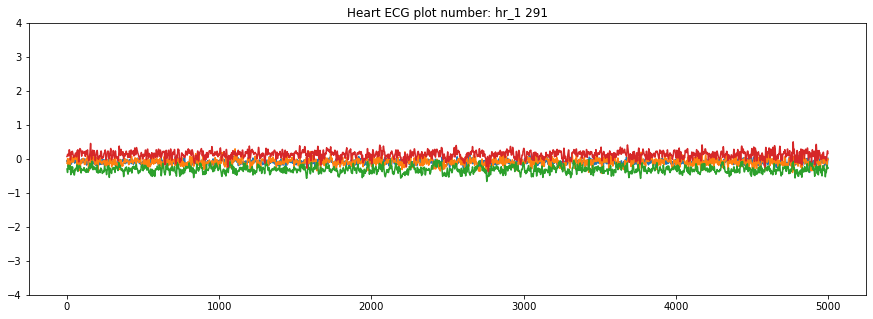

...

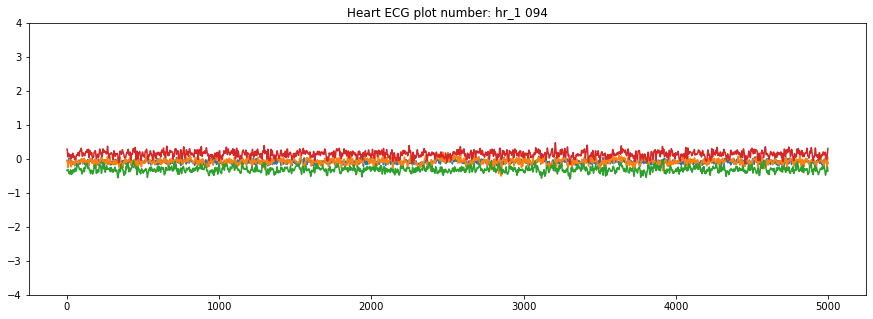

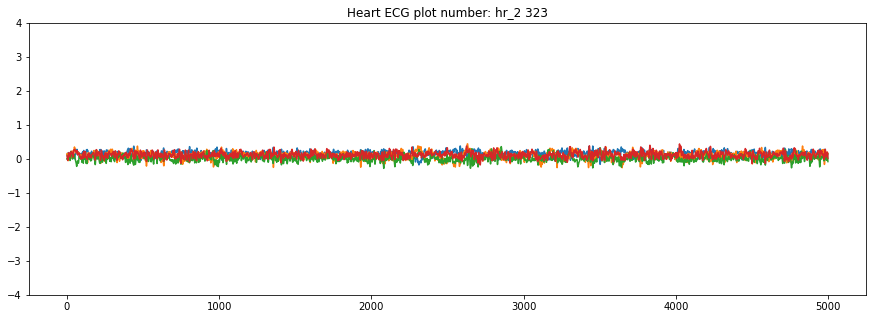

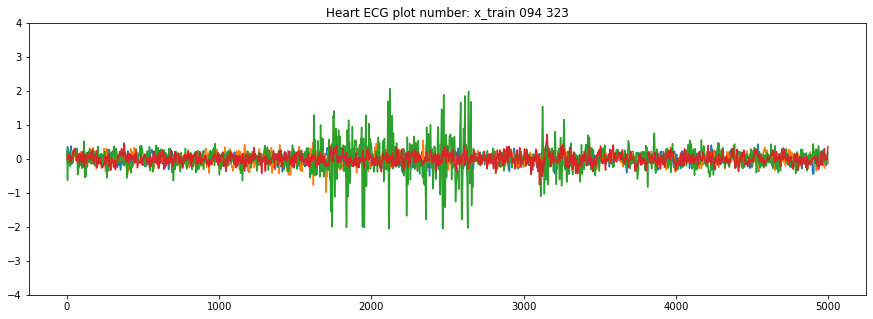

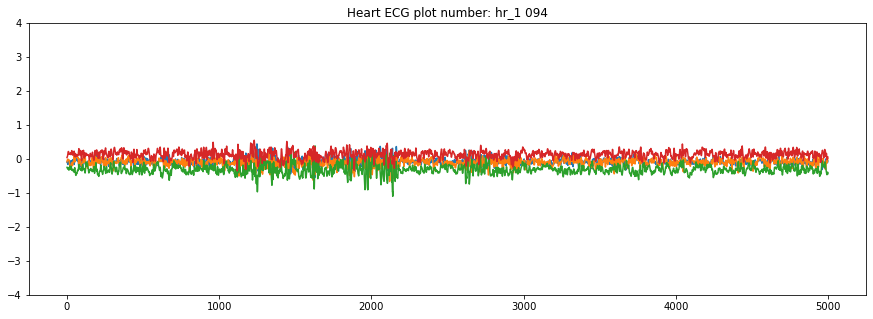

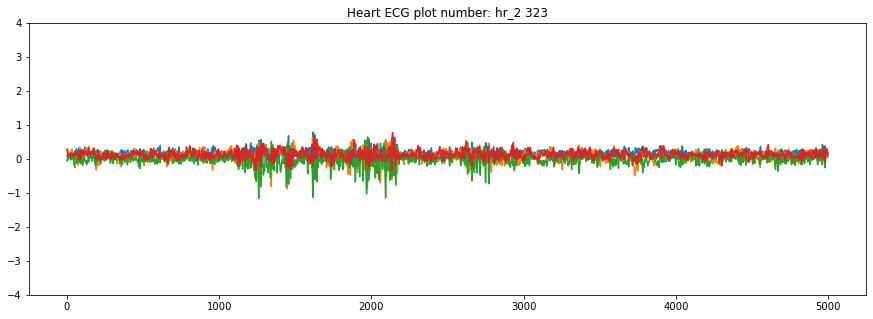

In [24]:
for nr_prediction, predictions in enumerate(predictions_list):    
    len_predictions, _, _ = predictions[model_config["source_names"][0]].shape

    for sample in range(len_predictions):
        plot_heartecg(x_test_long[nr_prediction][sample][:5000][:], 'x_train '+str(hr_1_list[nr_prediction] + ' ' + hr_2_list[nr_prediction]))
        plot_heartecg(predictions[model_config["source_names"][0]][sample,:5000,:4], 'hr_1 '+str(hr_1_list[nr_prediction]))
        plot_heartecg(predictions[model_config["source_names"][0]][sample,:5000,4:], 'hr_2 '+str(hr_2_list[nr_prediction]))